# Phase 2: Exploratory Data Analysis (EDA)

In this phase, we explore the cleaned datasets to understand the distribution of resources across NYC.

## Goals:
1. **Basic Stats**: Summary statistics for each dataset.
2. **Distribution Analysis**: Visualizing resource counts per borough.
3. **Geospatial Overview**: Initial maps of resource locations.
4. **Temporal Trends**: Analyzing changes in shelter occupancy and crime over time.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Set style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

PROCESSED_DIR = '../data/processed/'

def load_processed(filename):
    return pd.read_csv(os.path.join(PROCESSED_DIR, filename))

print("Setup complete.")

Setup complete.


## 1. Load Datasets

In [2]:
# 1. Load Data
fountains = load_processed('drinking_fountains_cleaned.csv')
centers = load_processed('drop_in_centers_cleaned.csv')
crime = load_processed('drug_crime_cleaned.csv')
link = load_processed('link_nyc_cleaned.csv')
toilets = load_processed('public_toilets_cleaned.csv')
rhy = load_processed('rhy_census_cleaned.csv')
shelter = load_processed('shelter_repair_cleaned.csv')

# 2. Apply Temporal Filtering (Last 10 Years: 2014-2024)
# Filter Crime
crime['cmplnt_fr_dt'] = pd.to_datetime(crime['cmplnt_fr_dt'], errors='coerce')
crime = crime[crime['cmplnt_fr_dt'].dt.year >= 2014]

# Filter RHY Census (if date exists)
if 'date' in rhy.columns:
    rhy['date'] = pd.to_datetime(rhy['date'], errors='coerce')
    rhy = rhy[rhy['date'].dt.year >= 2014]

print(f"Data Loaded and Filtered (Last 10 Years Only)")
print(f"Crime Rows: {len(crime)}")
print(f"Census Rows: {len(rhy)}")


Data Loaded and Filtered (Last 10 Years Only)
Crime Rows: 197354
Census Rows: 8219


## 2. Basic Stats & Distributions
Here we compare how many resources are available in each borough. This helps us see if certain areas are underserved.

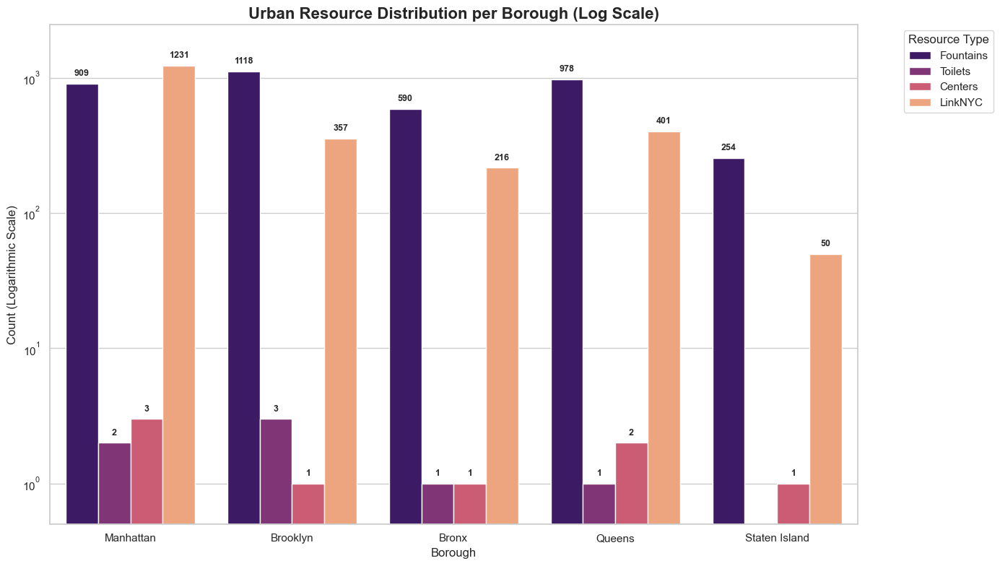

In [3]:
# Standardizing index names for the summary plot
res_summary = pd.DataFrame({
    'Fountains': fountains['borough'].value_counts(),
    'Toilets': toilets['boro_name'].value_counts(),
    'Centers': centers['borough'].value_counts(),
    'LinkNYC': link['boro'].value_counts()
}).fillna(0)

# Ensure the index only contains the 5 boroughs
boroughs = ['Manhattan', 'Brooklyn', 'Bronx', 'Queens', 'Staten Island']
res_summary = res_summary.reindex(boroughs).fillna(0)

# Melt for better plotting with Seaborn
plot_df = res_summary.reset_index().melt(id_vars='index', var_name='Resource', value_name='Count')
plot_df.rename(columns={'index': 'Borough'}, inplace=True)

plt.figure(figsize=(14, 8))
ax = sns.barplot(data=plot_df, x='Borough', y='Count', hue='Resource', palette='magma')

# 1. Use Log Scale to handle the huge disparity (thousands vs single digits)
plt.yscale('log')
plt.ylim(0.5, plot_df['Count'].max() * 2) # Start at 0.5 so '1' is visible

# 2. Add exact count labels on top of bars
for p in ax.patches:
    if p.get_height() > 0:
        ax.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points',
                   fontsize=9, fontweight='bold')

plt.title('Urban Resource Distribution per Borough (Log Scale)', fontsize=16, fontweight='bold')
plt.ylabel('Count (Logarithmic Scale)', fontsize=12)
plt.xlabel('Borough', fontsize=12)
plt.legend(title='Resource Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## 3. Geospatial Distribution
Visualizing the density of resources. Red areas (crime) vs. Blue/Green/Orange points (resources).

In [39]:
import folium
from folium import plugins
from IPython.display import display

# 1. Custom CSS Cluster Logic
# Function to create different looking clusters for different types
def get_custom_cluster(color, glow_color, shape="50%"):
    return f"""
    function(cluster) {{
        return new L.DivIcon({{ 
            html: '<div style="background-color: {color}; color: white; border-radius: {shape}; width: 32px; height: 32px; display: flex; justify-content: center; align-items: center; border: 2px solid {glow_color}; box-shadow: 0 0 12px {glow_color}; font-weight: bold;">' + cluster.getChildCount() + '</div>', 
            className: 'marker-cluster', iconSize: new L.Point(40, 40) 
        }});
    }}
    """

# 2. INITIALIZE MAP
m = folium.Map(location=[40.7128, -74.0060], zoom_start=11, tiles='CartoDB dark_matter')

# 3. CRIME HOTSPOTS (Unchanged)
weights = recent_crime.groupby(['latitude', 'longitude']).size().reset_index(name='count')
hotspots = weights[weights['count'] > weights['count'].quantile(0.95)]
plugins.HeatMap(
    hotspots.values.tolist(), 
    name="Crime Risk Hotspots", radius=10, blur=8, min_opacity=0.4,
    gradient={0.4: 'orange', 0.7: 'red', 1: 'darkred'} 
).add_to(m)

# 4. RESOURCES (With distinct visual styles)

# WATER: Cyan Circles + Blue Round Glow
fountain_cluster = plugins.MarkerCluster(
    name="Drinking Fountains",
    icon_create_function=get_custom_cluster("rgba(0, 191, 255, 0.7)", "cyan")
).add_to(m)

for _, row in fountains.dropna(subset=['latitude', 'longitude']).iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']], 
        radius=2.5, color='cyan', fill=True, fill_opacity=0.8,
        popup="Fountain"
    ).add_to(fountain_cluster)

# DIGITAL: Black/White Icons + Yellow Square Glow
link_cluster = plugins.MarkerCluster(
    name="LinkNYC Wifi Hubs",
    icon_create_function=get_custom_cluster("rgba(30, 30, 30, 0.9)", "gold", shape="5px") # Square-ish for Tech
).add_to(m)

for _, row in link.dropna(subset=['latitude', 'longitude']).iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']], 
        icon=folium.Icon(color='black', icon='wifi', prefix='fa', icon_color='white'),
        popup="LinkNYC Hub"
    ).add_to(link_cluster)

# 5. OTHER RESOURCES (Small Datasets)
centers_layer = folium.FeatureGroup(name="Drop-in Centers")
for _, row in centers.dropna(subset=['latitude', 'longitude']).iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']], icon=folium.Icon(color='green', icon='home', prefix='fa')).add_to(centers_layer)
centers_layer.add_to(m)

toilets_layer = folium.FeatureGroup(name="Public Toilets")
for _, row in toilets.dropna(subset=['latitude', 'longitude']).iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']], icon=folium.Icon(color='orange', icon='restroom', prefix='fa')).add_to(toilets_layer)
toilets_layer.add_to(m)

# 6. SAVE & VIEW
folium.LayerControl(collapsed=False).add_to(m)
m.save('final_survival_map.html')
display(m)
